**Завдання 3**
Я обрала тему переносу стиля на зображення.

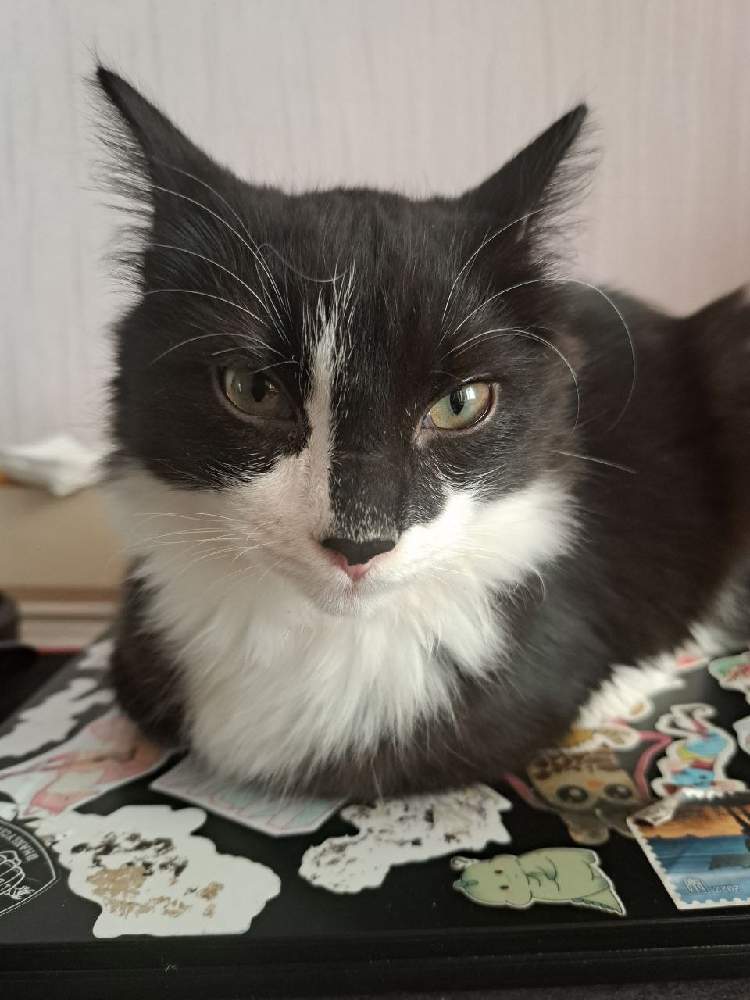

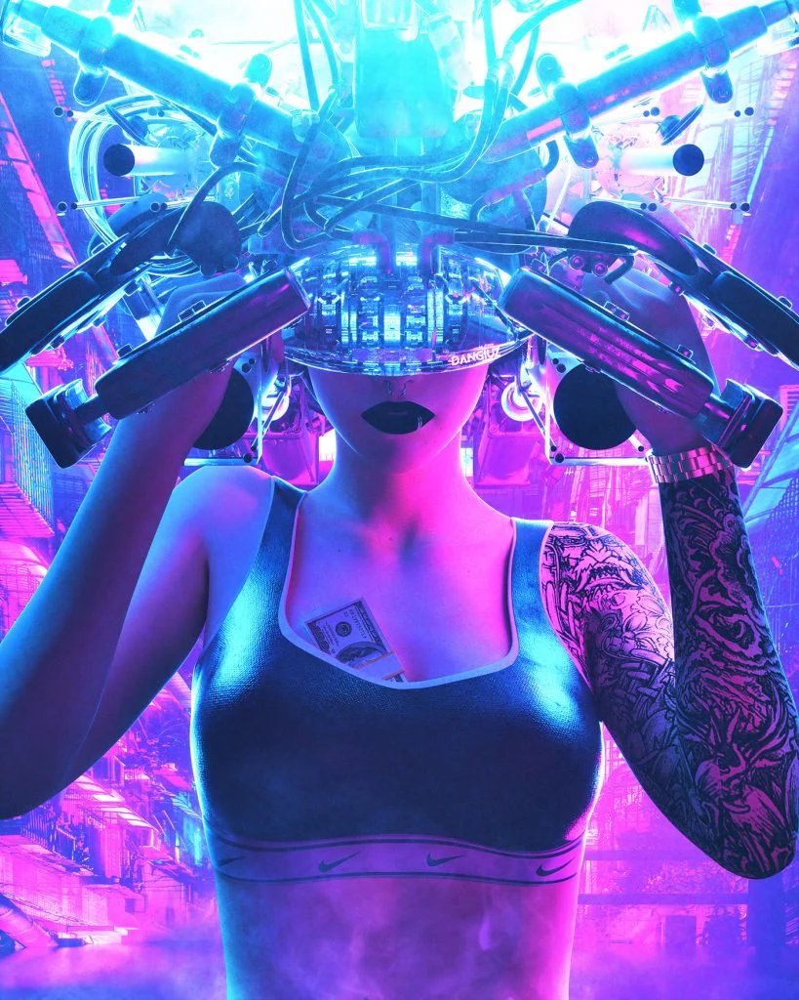

In [9]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import keras
import numpy as np
import tensorflow as tf
from keras.applications import vgg19
#politehnika https://i.imgur.com/BjGnZAS.png
#sterry night https://i.imgur.com/9ooB60I.jpg
#syber punk https://i.imgur.com/uxmE1qn.png
#bysya https://i.imgur.com/ZydCpyi.png
#krolya https://i.imgur.com/wvFSjT6.png
#luu https://i.imgur.com/Vt7obII.png
base_image_path = keras.utils.get_file("Vt7obII.png", "https://i.imgur.com/Vt7obII.png")
style_reference_image_path = keras.utils.get_file(
    "uxmE1qn.png", "https://i.imgur.com/uxmE1qn.png"
)
result_prefix = "paris_generated"

# Weights of the different loss components
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8

# Dimensions of the generated picture.
width, height = keras.utils.load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)
from IPython.display import Image, display

display(Image(base_image_path))
display(Image(style_reference_image_path))

Беремо зображення кота та стилю кіберпанку для переносу.

In [10]:
def preprocess_image(image_path):
    # Util function to open, resize and format pictures into appropriate tensors
    img = keras.utils.load_img(image_path, target_size=(img_nrows, img_ncols))
    img = keras.utils.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)


def deprocess_image(x):
    # Util function to convert a tensor into a valid image
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

In [11]:
# The gram matrix of an image tensor (feature-wise outer product)


def gram_matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram


# The "style loss" is designed to maintain
# the style of the reference image in the generated image.
# It is based on the gram matrices (which capture style) of
# feature maps from the style reference image
# and from the generated image


def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (channels**2) * (size**2))


# An auxiliary loss function
# designed to maintain the "content" of the
# base image in the generated image


def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))


# The 3rd loss function, total variation loss,
# designed to keep the generated image locally coherent


def total_variation_loss(x):
    a = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, 1:, : img_ncols - 1, :]
    )
    b = tf.square(
        x[:, : img_nrows - 1, : img_ncols - 1, :] - x[:, : img_nrows - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))



In [12]:
# Build a VGG19 model loaded with pre-trained ImageNet weights
model = vgg19.VGG19(weights="imagenet", include_top=False)
model.summary()
# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

# Set up a model that returns the activation values for every layer in
# VGG19 (as a dict).
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

Модель конвуляційну VGG19, яка складається з конвуляційних шарів різних розмірів та повнозв'язних шарів між ними.

In [13]:
# List of layers to use for the style loss.
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]
# The layer to use for the content loss.
content_layer_name = "block5_conv2"


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)

    # Initialize the loss
    loss = tf.zeros(shape=())

    # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_reference_features, combination_features)
        loss += (style_weight / len(style_layer_names)) * sl

    # Add total variation loss
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss

In [14]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads

In [15]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(base_image_path)
style_reference_image = preprocess_image(style_reference_image_path)
combination_image = tf.Variable(preprocess_image(base_image_path))

iterations = 4000
for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 10 == 0:
        print("Iteration %d: loss=%.2f" % (i, loss))
        img = deprocess_image(combination_image.numpy())
        fname =  "%d.png" % i
        #keras.utils.save_img(fname, img)

Iteration 10: loss=90355.55
Iteration 20: loss=19862.60
Iteration 30: loss=19186.21
Iteration 40: loss=12806.55
Iteration 50: loss=10951.01
Iteration 60: loss=15492.17
Iteration 70: loss=10455.38
Iteration 80: loss=12920.16
Iteration 90: loss=10163.91
Iteration 100: loss=8334.50
Iteration 110: loss=8291.82
Iteration 120: loss=8085.73
Iteration 130: loss=7969.29
Iteration 140: loss=9876.31
Iteration 150: loss=11710.75
Iteration 160: loss=8033.45
Iteration 170: loss=6875.72
Iteration 180: loss=6650.25
Iteration 190: loss=6486.73
Iteration 200: loss=6513.36
Iteration 210: loss=6358.65
Iteration 220: loss=6524.38
Iteration 230: loss=6022.36
Iteration 240: loss=5745.74
Iteration 250: loss=5789.59
Iteration 260: loss=5799.28
Iteration 270: loss=5337.84
Iteration 280: loss=5786.10
Iteration 290: loss=6992.06
Iteration 300: loss=5577.94
Iteration 310: loss=5292.03
Iteration 320: loss=4975.90
Iteration 330: loss=4816.15
Iteration 340: loss=4775.73
Iteration 350: loss=5124.10
Iteration 360: loss

Навчання знов займає близько 10 хвилин, але це дозволить подивитися на зміну результату протягом 4000 ітерацій.

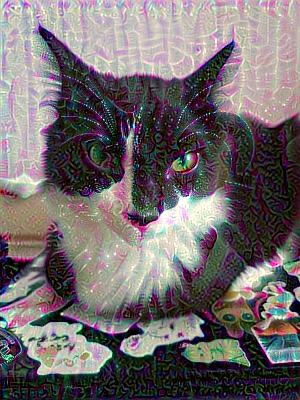

In [16]:
display(Image(result_prefix + "_at_iteration_10.png"))
#10та ітерація

/content/paris_generated_at_iteration_100.png


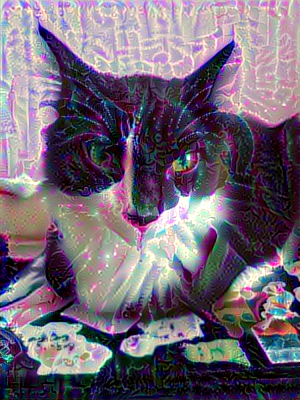

/content/paris_generated_at_iteration_200.png


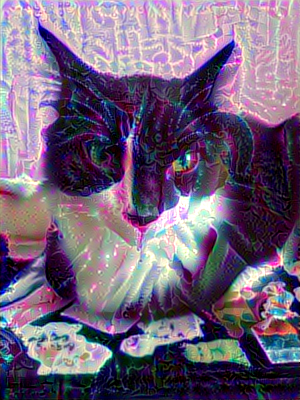

/content/paris_generated_at_iteration_300.png


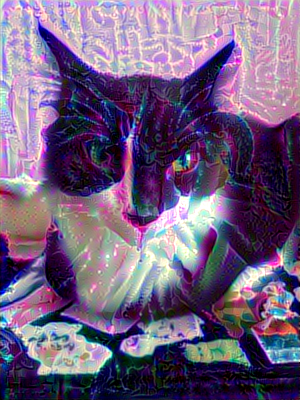

/content/paris_generated_at_iteration_400.png


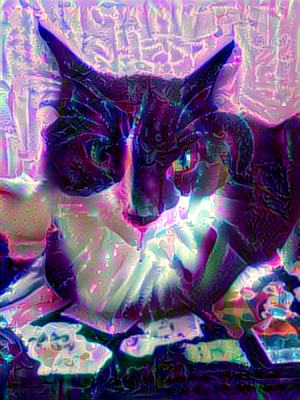

/content/paris_generated_at_iteration_500.png


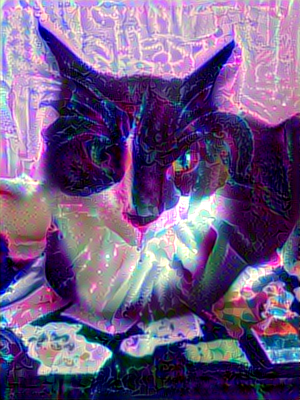

/content/paris_generated_at_iteration_600.png


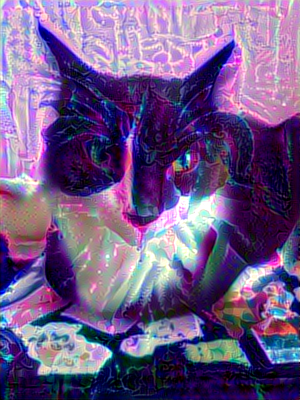

/content/paris_generated_at_iteration_700.png


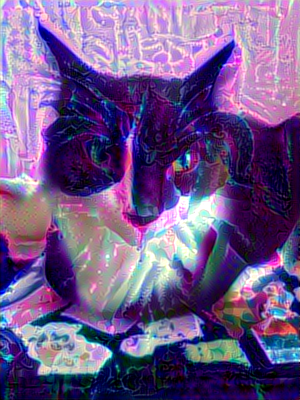

/content/paris_generated_at_iteration_800.png


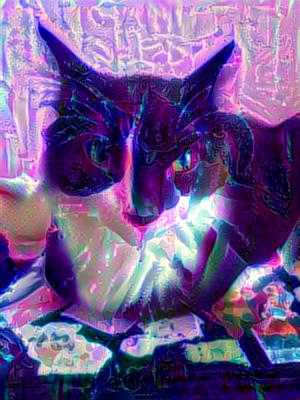

/content/paris_generated_at_iteration_900.png


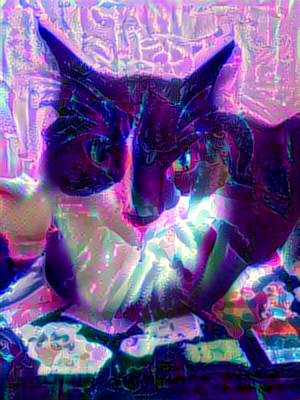

/content/paris_generated_at_iteration_1000.png


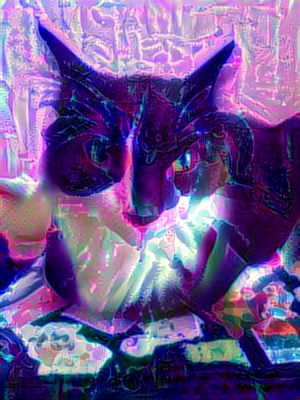

/content/paris_generated_at_iteration_1100.png


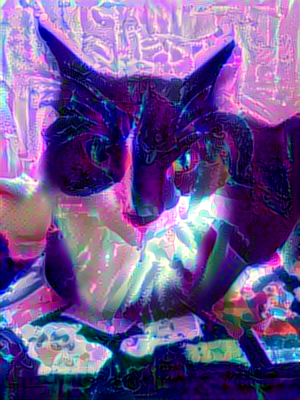

/content/paris_generated_at_iteration_1200.png


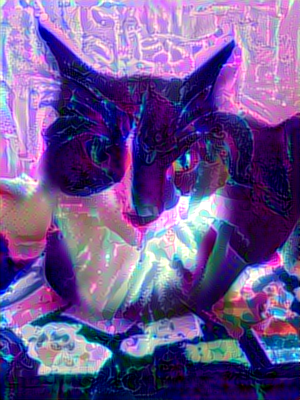

/content/paris_generated_at_iteration_1300.png


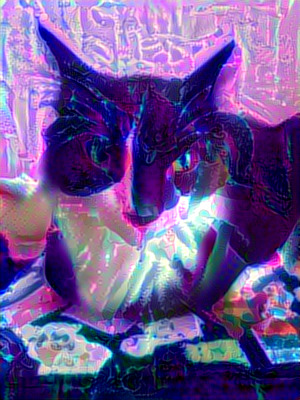

/content/paris_generated_at_iteration_1400.png


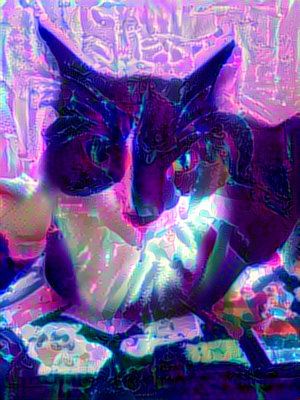

/content/paris_generated_at_iteration_1500.png


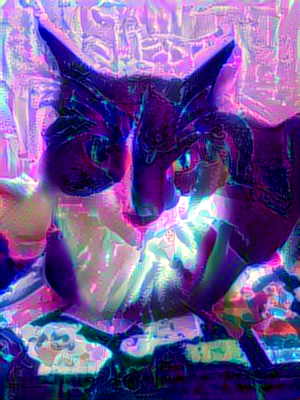

/content/paris_generated_at_iteration_1600.png


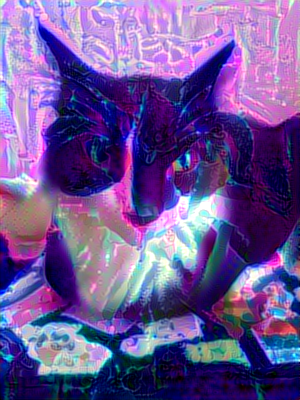

/content/paris_generated_at_iteration_1700.png


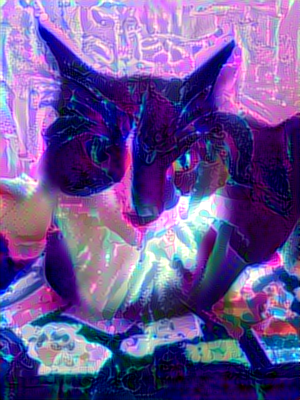

/content/paris_generated_at_iteration_1800.png


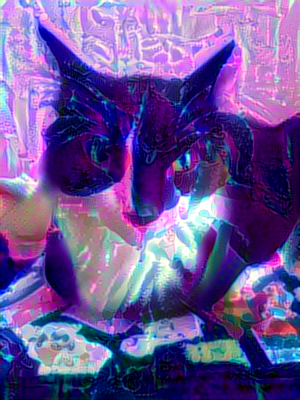

/content/paris_generated_at_iteration_1900.png


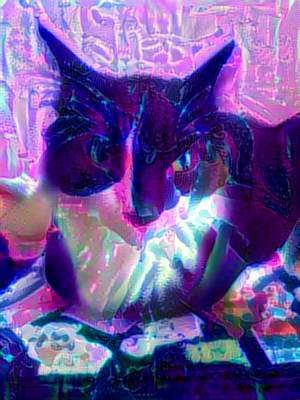

/content/paris_generated_at_iteration_2000.png


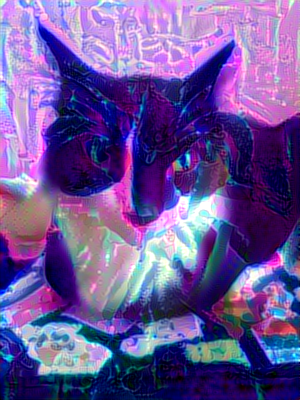

/content/paris_generated_at_iteration_2100.png


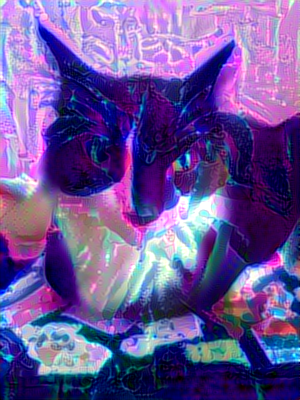

/content/paris_generated_at_iteration_2200.png


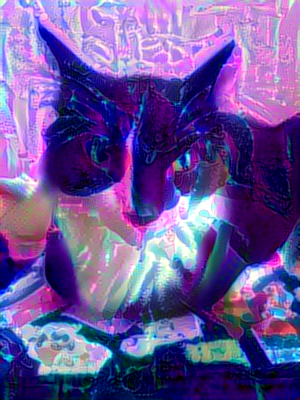

/content/paris_generated_at_iteration_2300.png


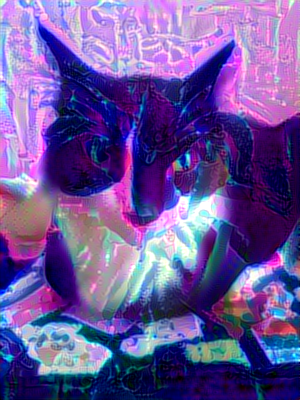

/content/paris_generated_at_iteration_2400.png


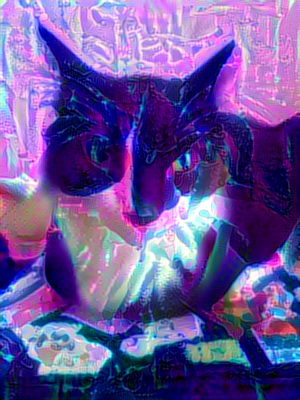

/content/paris_generated_at_iteration_2500.png


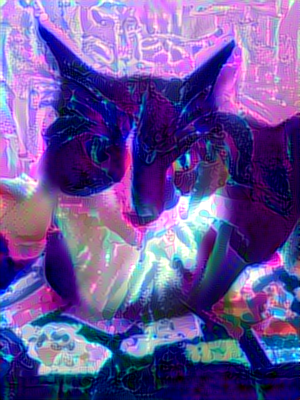

/content/paris_generated_at_iteration_2600.png


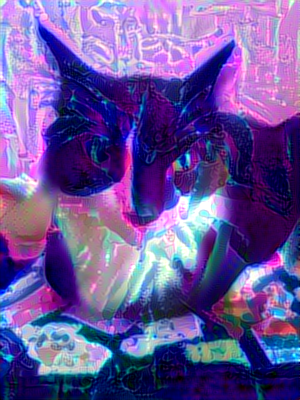

/content/paris_generated_at_iteration_2700.png


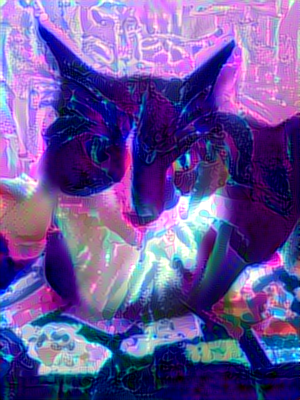

/content/paris_generated_at_iteration_2800.png


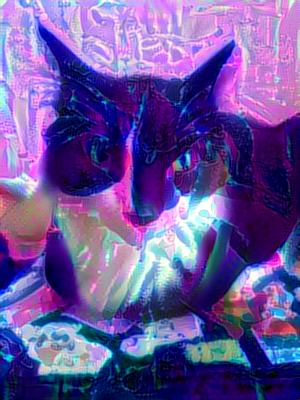

/content/paris_generated_at_iteration_2900.png


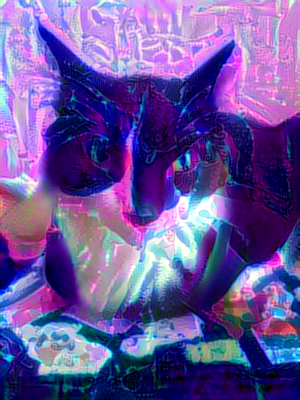

/content/paris_generated_at_iteration_3000.png


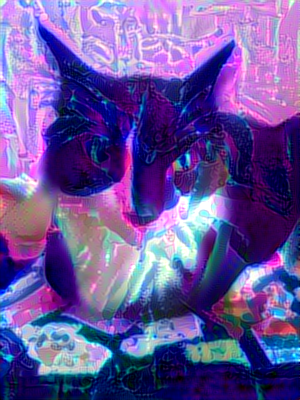

/content/paris_generated_at_iteration_3100.png


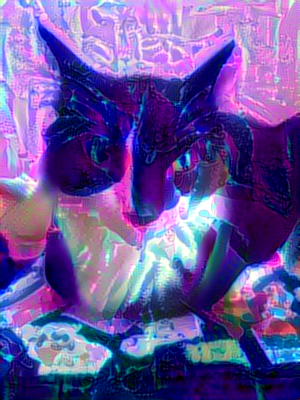

/content/paris_generated_at_iteration_3200.png


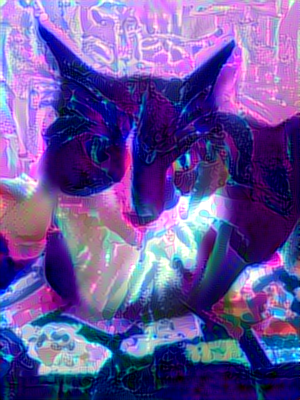

/content/paris_generated_at_iteration_3300.png


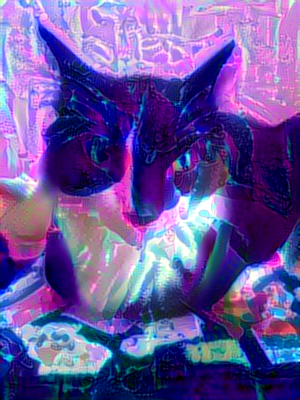

/content/paris_generated_at_iteration_3400.png


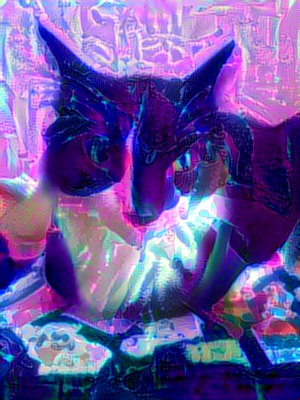

/content/paris_generated_at_iteration_3500.png


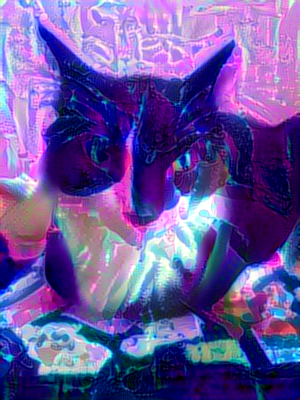

/content/paris_generated_at_iteration_3600.png


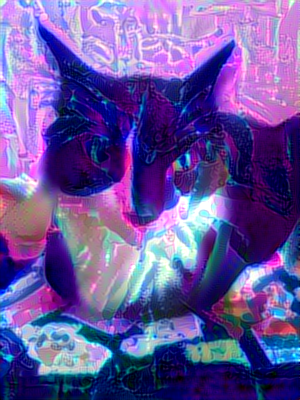

/content/paris_generated_at_iteration_3700.png


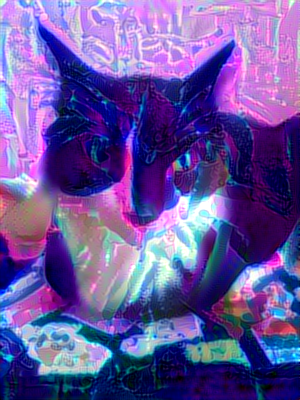

/content/paris_generated_at_iteration_3800.png


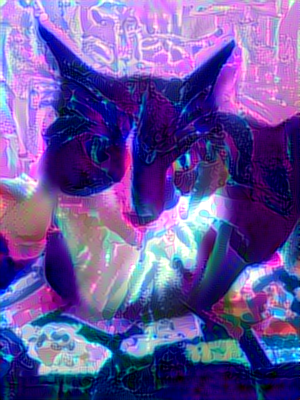

/content/paris_generated_at_iteration_3900.png


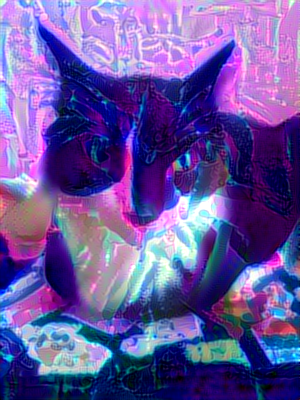

In [27]:
#всі наступні ітерації
import re
def extract_iteration_number(filename):
    match = re.search(r'iteration_(\d+).png', filename)
    return int(match.group(1)) if match else None

file_list = [f"/content/paris_generated_at_iteration_{i}.png" for i in range(1, 4000)]
sorted_files = sorted(file_list, key=extract_iteration_number)
selected_files = [file for i, file in enumerate(sorted_files, start=1) if i % 100 == 0]



# Відображення кожного зображення
for i, path in enumerate(selected_files):
  print(path)
  display(Image(path))
